# **Group Assignment** - Bike Sharing

- `instant`: record index
- `dteday` : date
- `season` : season (1:springer, 2:summer, 3:fall, 4:winter)
- `yr` : year (0: 2011, 1:2012)
- `mnth` : month ( 1 to 12)
- `hr` : hour (0 to 23)
- `holiday` : weather day is holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
- `weekday` : day of the week
- `workingday` : if day is neither weekend nor holiday is 1, otherwise is 0.
+ `weathersit` : 
	- 1: Clear, Few clouds, Partly cloudy, Partly cloudy
	- 2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
	- 3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
	- 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
- `temp` : Normalized temperature in Celsius. The values are divided to 41 (max)
- `atemp`: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
- `hum`: Normalized humidity. The values are divided to 100 (max)
- `windspeed`: Normalized wind speed. The values are divided to 67 (max)
- `casual`: count of casual users
- `registered`: count of registered users
- `cnt`: count of total rental bikes including both casual and registered

## PART I: Exploratory Data Analysis

In [1]:
from tabulate import tabulate
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import time
import plotly.subplots as sp
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as pyo
import numpy as np
import pickle

### 1. Formating the data

In [2]:
df = pd.read_csv("bike-sharing_hourly.csv")
df.head(2)

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40


In [3]:
df.dtypes

instant         int64
dteday         object
season          int64
yr              int64
mnth            int64
hr              int64
holiday         int64
weekday         int64
workingday      int64
weathersit      int64
temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
dtype: object

In [4]:
df.isna().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [5]:
df.rename(columns={'instant':'rec_id','dteday':'datetime','yr':'year','mnth':'month','weathersit':'weather_condition',
                       'hum':'humidity','cnt':'total_count'},inplace=True)

In [6]:
df.describe()

,rec_id,season,year,month,hr,holiday,weekday,workingday,weather_condition,temp,atemp,humidity,windspeed,casual,registered,total_count
count,17379.0000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,8690.0000,2.501640,0.502561,6.537775,11.546752,0.028770,3.003683,0.682721,1.425283,0.496987,0.475775,0.627229,0.190098,35.676218,153.786869,189.463088
std,5017.0295,1.106918,0.500008,3.438776,6.914405,0.167165,2.005771,0.465431,0.639357,0.192556,0.171850,0.192930,0.122340,49.305030,151.357286,181.387599
min,1.0000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,4345.5000,2.000000,0.000000,4.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.340000,0.333300,0.480000,0.104500,4.000000,34.000000,40.000000
50%,8690.0000,3.000000,1.000000,7.000000,12.000000,0.000000,3.000000,1.000000,1.000000,0.500000,0.484800,0.630000,0.194000,17.000000,115.000000,142.000000
75%,13034.5000,3.000000,1.000000,10.000000,18.000000,0.000000,5.000000,1.000000,2.000000,0.660000,0.621200,0.780000,0.253700,48.000000,220.000000,281.000000
max,17379.0000,4.000000,1.000000,12.000000,23.000000,1.000000,6.000000,1.000000,4.000000,1.000000,1.000000,1.000000,0.850700,367.000000,886.000000,977.000000


In [7]:
df['datetime']=pd.to_datetime(df.datetime)
df['season']=df.season.astype('category')
df['year']=df.year.astype('category')
df['month']=df.month.astype('category')
df['holiday']=df.holiday.astype('category')
df['weekday']=df.weekday.astype('category')
df['workingday']=df.workingday.astype('category')
df['weather_condition']=df.weather_condition.astype('category')

### 2. Exploratory graphs

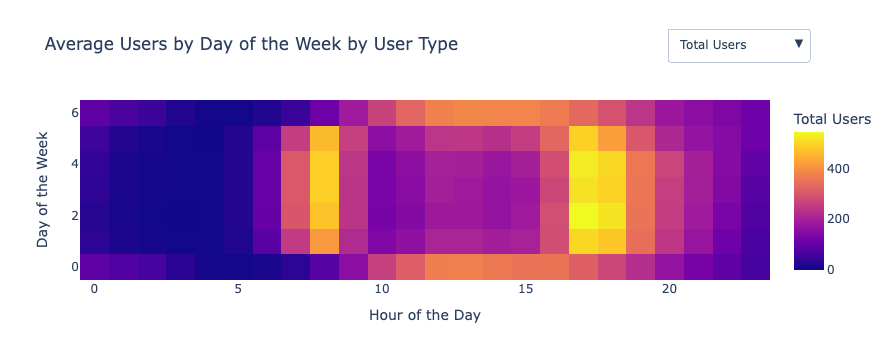

In [52]:
import plotly.graph_objects as go
import pandas as pd

# Assuming you have a DataFrame 'df' with the necessary data

# Create pivot tables for each user type
pivot_total = df.pivot_table(values='total_count', index='weekday', columns='hr', aggfunc='mean')
pivot_registered = df.pivot_table(values='registered', index='weekday', columns='hr', aggfunc='mean')
pivot_casual = df.pivot_table(values='casual', index='weekday', columns='hr', aggfunc='mean')

fig = go.Figure()

# Add Heatmap for Hourly Total Users by Day of the Week
fig.add_trace(go.Heatmap(
    z=pivot_total.values,
    x=pivot_total.columns,
    y=pivot_total.index,
    colorscale='plasma',
    zmin=0,
    zmax=pivot_total.values.max(),
    colorbar=dict(title='Total Users'),
    name='Total Users'  # Name for the legend
))

# Add Heatmap for Hourly Registered Users by Day of the Week (hidden by default)
fig.add_trace(go.Heatmap(
    z=pivot_registered.values,
    x=pivot_registered.columns,
    y=pivot_registered.index,
    colorscale='plasma',
    zmin=0,
    zmax=pivot_registered.values.max(),
    colorbar=dict(title='Registered Users'),
    name='Registered Users',
    visible=False  # Hide this trace by default
))

# Add Heatmap for Hourly Casual Users by Day of the Week (hidden by default)
fig.add_trace(go.Heatmap(
    z=pivot_casual.values,
    x=pivot_casual.columns,
    y=pivot_casual.index,
    colorscale='plasma',
    zmin=0,
    zmax=pivot_casual.values.max(),
    colorbar=dict(title='Casual Users'),
    name='Casual Users',
    visible=False  # Hide this trace by default
))

# Create dropdown buttons
buttons = [
    dict(label='Total Users',
         method='update',
         args=[{'visible': [True, False, False]}]),
    dict(label='Registered Users',
         method='update',
         args=[{'visible': [False, True, False]}]),
    dict(label='Casual Users',
         method='update',
         args=[{'visible': [False, False, True]}]),
]

# Update layout for the entire figure
fig.update_layout(
    title='Average Users by Day of the Week by User Type',
    xaxis_title='Hour of the Day',
    yaxis_title='Day of the Week',
    template='plotly',
    updatemenus=[
        dict(buttons=buttons,
             direction='down',
             showactive=True,
             x=0.85,
             xanchor='left',
             y=1.4,
             yanchor='top')
    ]
)

# Show the figure
fig.show()


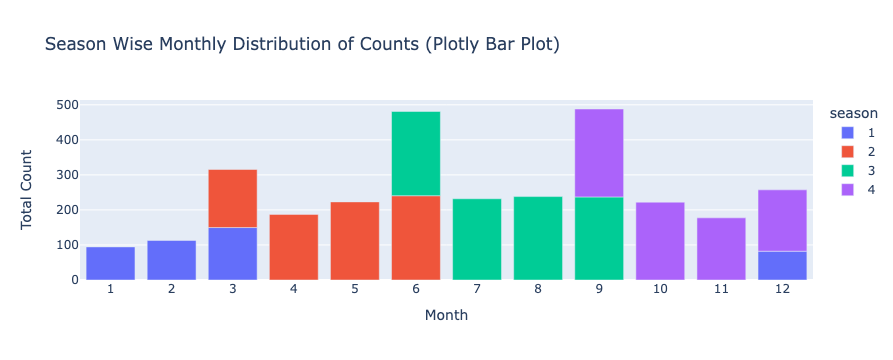

In [10]:
# Aggregate the data by month and weekday
agg_data = df.groupby(['month', 'season'])['total_count'].mean().reset_index()

# Create a bar plot for Weekday Wise Monthly Distribution of Counts using Plotly
fig_month = px.bar(agg_data, x='month', y='total_count', color='season',
                      labels={'month': 'Month', 'total_count': 'Total Count'},
                      title='Season Wise Monthly Distribution of Counts (Plotly Bar Plot)',
                      category_orders={'month': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]})  # Specify category order for months

# Customize the x-axis labels to display the actual months (e.g., 1 to 'January', 2 to 'February', etc.)
fig_month.update_xaxes(type='category', categoryorder='array',
                         categoryarray=['January', 'February', 'March', 'April', 'May', 'June',
                                        'July', 'August', 'September', 'October', 'November', 'December'])

# Show the chart
fig_month.show()

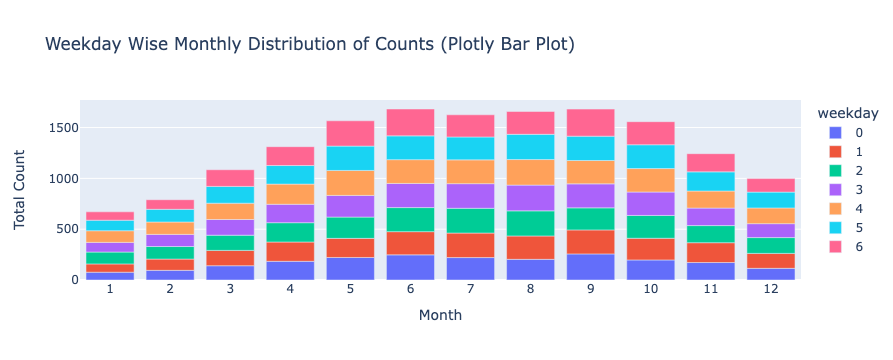

In [11]:
# Aggregate the data by month and weekday
agg_data = df.groupby(['month', 'weekday'])['total_count'].mean().reset_index()

# Create a bar plot for Weekday Wise Monthly Distribution of Counts using Plotly
fig_weekday = px.bar(agg_data, x='month', y='total_count', color='weekday',
                      labels={'month': 'Month', 'total_count': 'Total Count'},
                      title='Weekday Wise Monthly Distribution of Counts (Plotly Bar Plot)',
                      category_orders={'month': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]})  # Specify category order for months

# Customize the x-axis labels to display the actual months (e.g., 1 to 'January', 2 to 'February', etc.)
fig_weekday.update_xaxes(type='category', categoryorder='array',
                         categoryarray=['January', 'February', 'March', 'April', 'May', 'June',
                                        'July', 'August', 'September', 'October', 'November', 'December'])

# Show the chart
fig_weekday.show()


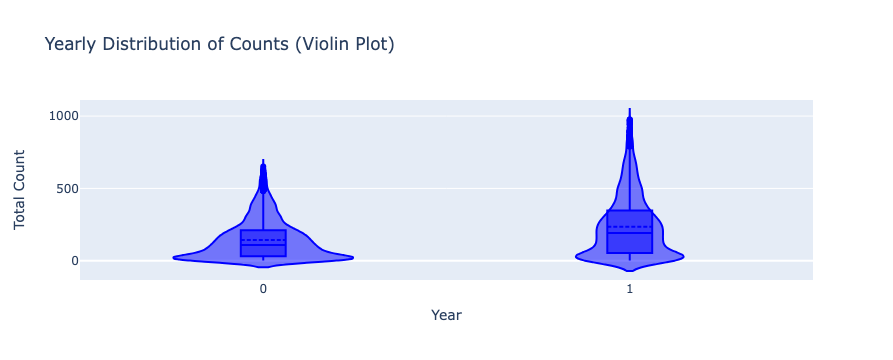

In [12]:
import plotly.graph_objects as go

# Create a violin plot for Yearly Distribution of Counts
fig_violin = go.Figure()
fig_violin.add_trace(
    go.Violin(
        x=df['year'],
        y=df['total_count'],
        box_visible=True,
        line_color='blue',
        meanline_visible=True,
        name='Total Count'
    )
)
fig_violin.update_layout(
    title='Yearly Distribution of Counts (Violin Plot)',
    xaxis_title='Year',
    yaxis_title='Total Count',
    template='plotly'
)

# Show the violin plot
fig_violin.show()


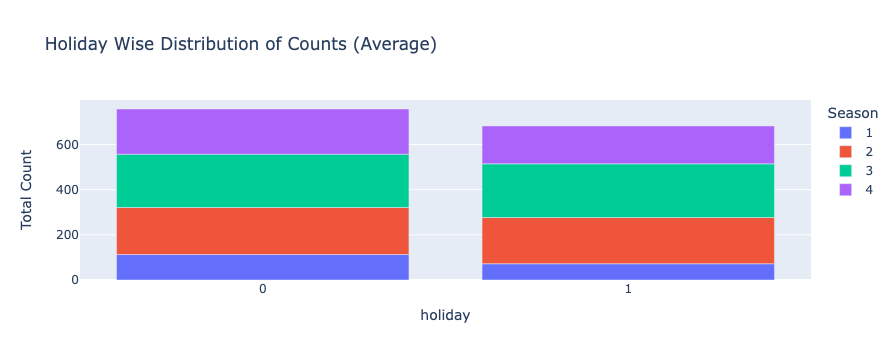

In [13]:
avg_data = df.groupby(['season', 'holiday'])['total_count'].mean().reset_index()

# Create a bar plot using Plotly
fig_holiday = px.bar(avg_data, x='holiday', y='total_count', color='season',
                        labels={'season': 'Season', 'total_count': 'Total Count'},
                        title='Holiday Wise Distribution of Counts (Average)')

# Customize the x-axis labels to display the actual season names
fig_holiday.update_xaxes(type='category', categoryorder='array',
                            categoryarray=['Spring', 'Summer', 'Fall'])

# Show the chart
fig_holiday.show()

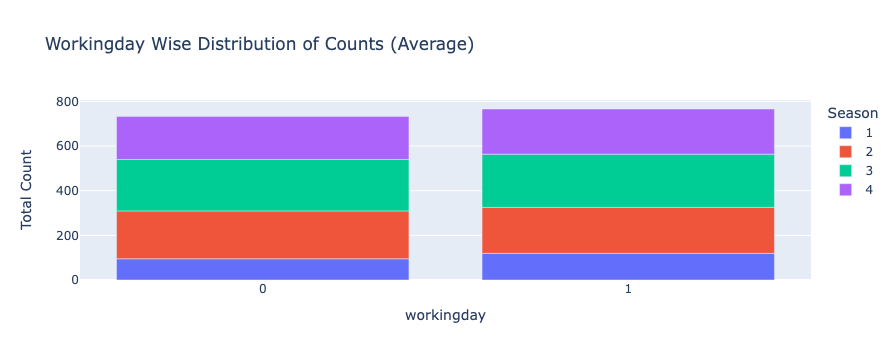

In [14]:
avg_data = df.groupby(['season', 'workingday'])['total_count'].mean().reset_index()

# Create a bar plot using Plotly
fig_workingday = px.bar(avg_data, x='workingday', y='total_count', color='season',
                        labels={'season': 'Season', 'total_count': 'Total Count'},
                        title='Workingday Wise Distribution of Counts (Average)')

# Customize the x-axis labels to display the actual season names
fig_workingday.update_xaxes(type='category', categoryorder='array',
                            categoryarray=['Spring', 'Summer', 'Fall'])

# Show the chart
fig_workingday.show()

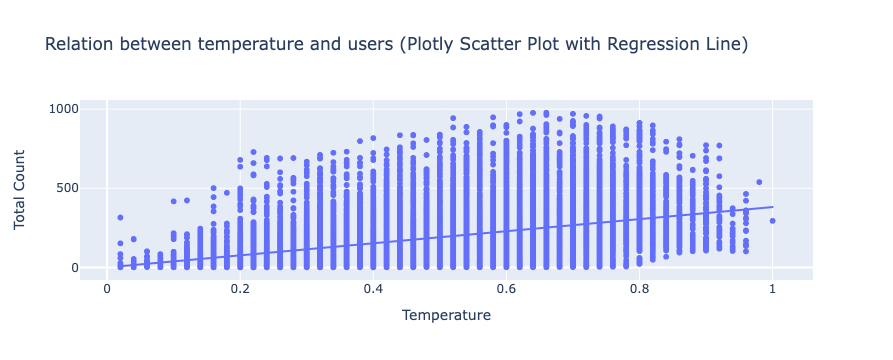

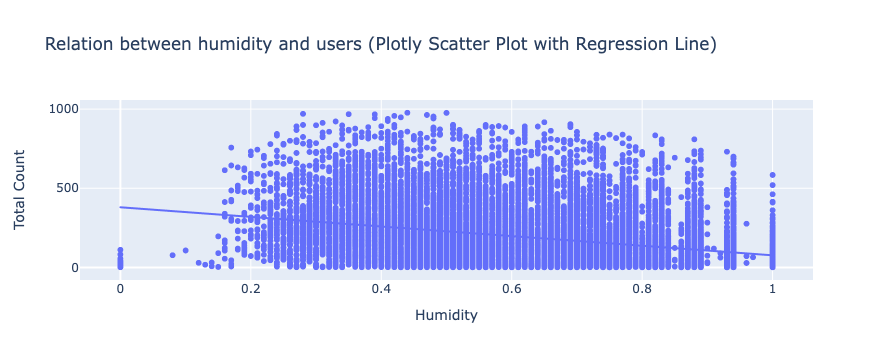

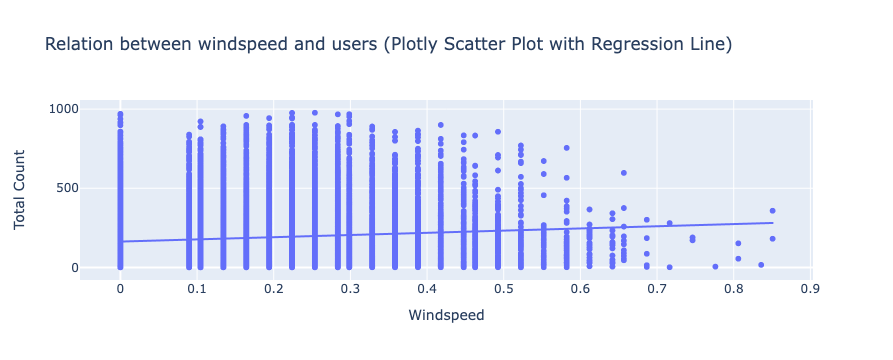

In [15]:
import plotly.express as px

# Create scatterplot for temperature vs. total_count with regression line
fig_temp = px.scatter(df, x='temp', y='total_count',
                      labels={'temp': 'Temperature', 'total_count': 'Total Count'},
                      title='Relation between temperature and users (Plotly Scatter Plot with Regression Line)',
                      trendline='ols')  # Add regression line using 'ols' (ordinary least squares) method

# Create scatterplot for humidity vs. total_count with regression line
fig_humidity = px.scatter(df, x='humidity', y='total_count',
                          labels={'humidity': 'Humidity', 'total_count': 'Total Count'},
                          title='Relation between humidity and users (Plotly Scatter Plot with Regression Line)',
                          trendline='ols')

# Create scatterplot for windspeed vs. total_count with regression line
fig_windspeed = px.scatter(df, x='windspeed', y='total_count',
                           labels={'windspeed': 'Windspeed', 'total_count': 'Total Count'},
                           title='Relation between windspeed and users (Plotly Scatter Plot with Regression Line)',
                           trendline='ols')

# Show the scatterplots with regression lines
fig_temp.show()
fig_humidity.show()
fig_windspeed.show()



### 3. Removing outliers

In [30]:
def remove_outliers(df, start_column_index, end_column_index, z_threshold=3):
    df_no_outliers = df.copy()
    
    for col in df_no_outliers.columns[start_column_index:end_column_index]:
        z_scores = np.abs((df_no_outliers[col] - df_no_outliers[col].mean()) / df_no_outliers[col].std())
        df_no_outliers = df_no_outliers[z_scores <= z_threshold]
    
    return df_no_outliers

In [31]:
filtered_df = remove_outliers(df, start_column_index=13, end_column_index = 17)

In [18]:
selected_columns = df.columns[11:]

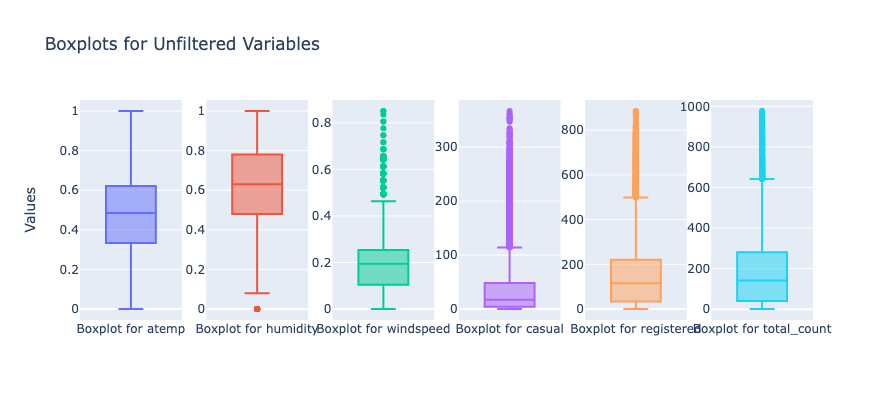

In [19]:
# Create subplots for the first set of box plots with a wider figure
fig1 = sp.make_subplots(
    rows=1, 
    cols=len(selected_columns),
    shared_yaxes=False,
    column_widths=[0.6] * len(selected_columns),  # Adjust the width as needed
)

# Define the figure size with increased height and width
fig1.update_layout(
    title='Boxplots for Unfiltered Variables',
    width=1000,  # Adjust the width as needed
    height=400,
    showlegend = False
)

for i, col in enumerate(selected_columns):
    box_trace = go.Box(y=df[col], name=f'Boxplot for {col}')
    fig1.add_trace(box_trace, row=1, col=i+1)

# Update layout for the y-axis title
fig1.update_yaxes(title_text='Values', row=1, col=1)

# Show the subplots
fig1.show()

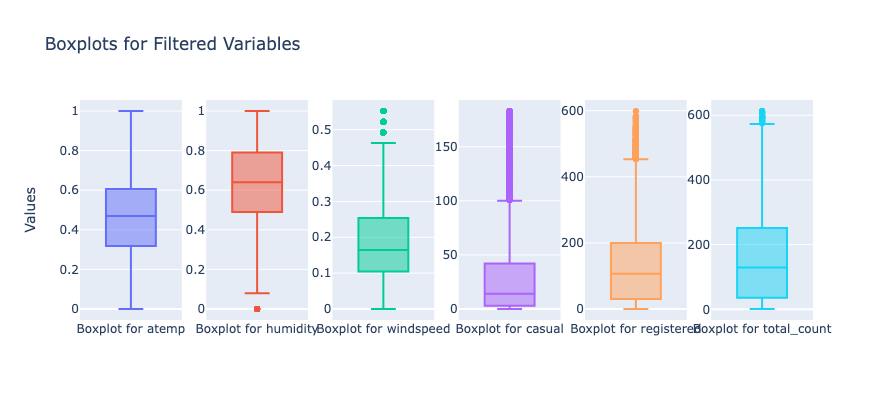

In [20]:
# Create subplots for the first set of box plots with a wider figure
fig2 = sp.make_subplots(
    rows=1, 
    cols=len(selected_columns),
    shared_yaxes=False,
    column_widths=[0.6] * len(selected_columns),  # Adjust the width as needed
)

# Define the figure size with increased height and width
fig2.update_layout(
    title='Boxplots for Filtered Variables',
    width=1000,  # Adjust the width as needed
    height=400,
    showlegend = False
)

for i, col in enumerate(selected_columns):
    box_trace = go.Box(y=filtered_df[col], name=f'Boxplot for {col}')
    fig2.add_trace(box_trace, row=1, col=i+1)

# Update layout for the y-axis title
fig2.update_yaxes(title_text='Values', row=1, col=1)

# Show the subplots
fig2.show()

### 4. Feature engineering

##### A) Daylight_hours variable

In [33]:
def calculate_daylight_hours(row):
    # Check if the hour falls within the defined daylight hours
    if 0 <= row['hr'] <= 7:
        return 0  # Night
    elif 8 <= row['hr'] <= 17:
        return 1  # Day
    else:
        return 0  # Night

In [34]:
filtered_df['daylight_hours'] = filtered_df.apply(calculate_daylight_hours, axis=1)
filtered_df['daylight_hours']=filtered_df.daylight_hours.astype('category')

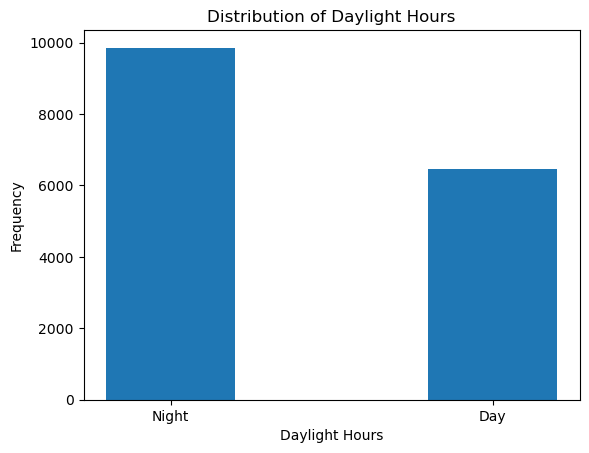

In [23]:
# Create a histogram
plt.hist(filtered_df['daylight_hours'], bins=[0, 1, 2], align='left', rwidth=0.4)
plt.xticks([0, 1], ['Night', 'Day'])
plt.xlabel('Daylight Hours')
plt.ylabel('Frequency')
plt.title('Distribution of Daylight Hours')
plt.show()

##### B) Lagged total count feature

/Users/charlesbeyrard/anaconda3/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



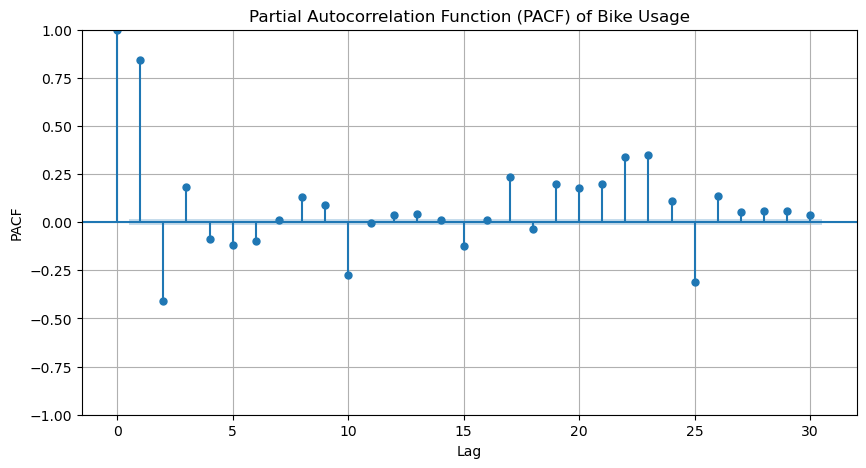

In [24]:
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
fig, ax = plt.subplots(figsize=(10, 5))
plot_pacf(df['total_count'], lags=30, ax=ax)
plt.title('Partial Autocorrelation Function (PACF) of Bike Usage')
plt.xlabel('Lag')
plt.ylabel('PACF')
plt.grid(True)
plt.show()

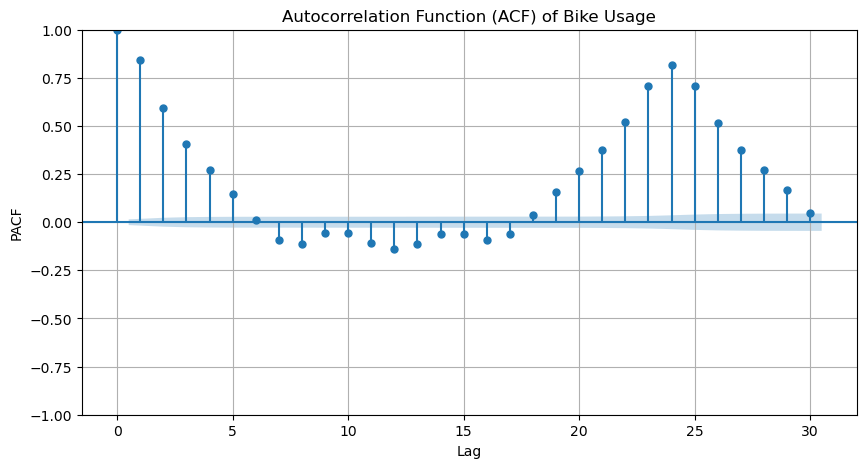

In [25]:
fig, ax = plt.subplots(figsize=(10, 5))
plot_acf(df['total_count'], lags=30, ax=ax)
plt.title('Autocorrelation Function (ACF) of Bike Usage')
plt.xlabel('Lag')
plt.ylabel('PACF')
plt.grid(True)
plt.show()

In [35]:
filtered_df['lag_1'] = filtered_df['total_count'].shift(1)
filtered_df['lag_24'] = filtered_df['total_count'].shift(24)

##### Correlation analysis

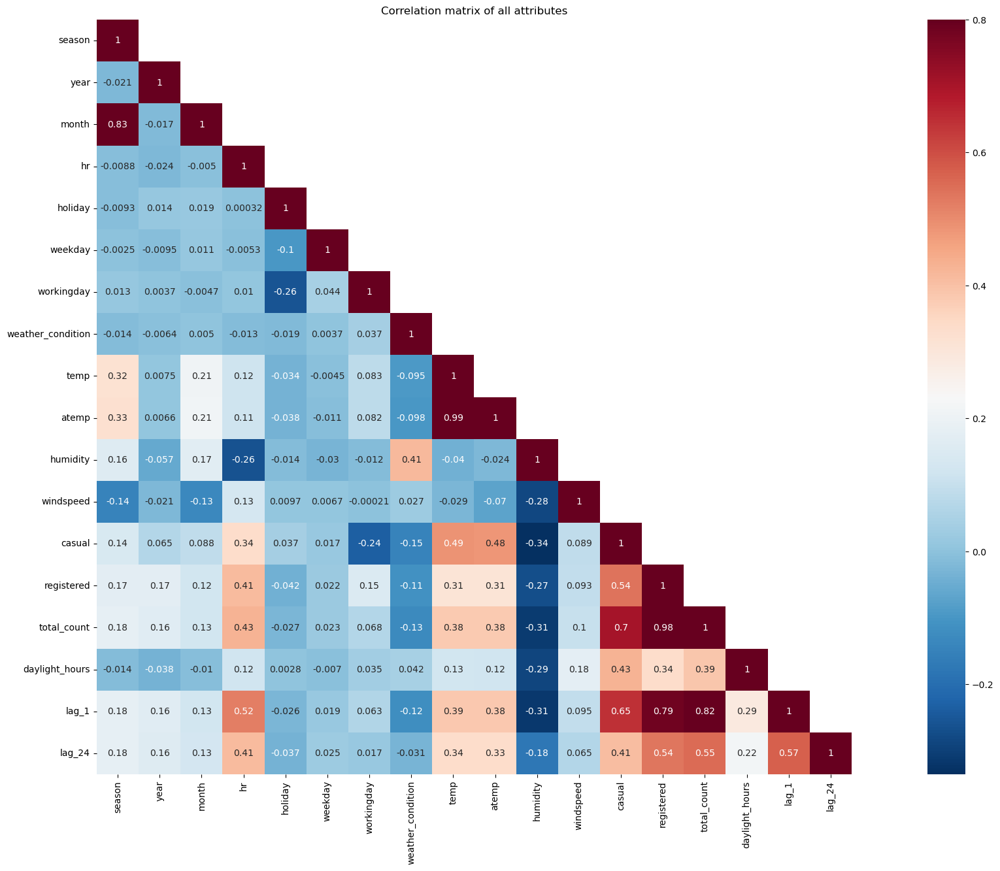

In [39]:
cmap = sns.color_palette("RdBu_r", as_cmap=True)
correMtr = filtered_df.drop(['rec_id', 'datetime'], axis=1).corr()  # Exclude 'rec_id' and 'datetime'
mask = np.array(correMtr)
mask[np.tril_indices_from(mask)] = False

# Heat map for correlation matrix of attributes
fig, ax = plt.subplots(figsize=(30, 15))
sns.heatmap(correMtr, mask=mask, vmax=0.8, square=True, annot=True, ax=ax, cmap=cmap)
ax.set_title('Correlation matrix of all attributes')
plt.show()


In [54]:
filtered_df=filtered_df.iloc[24:]
model_df = filtered_df.drop(['rec_id', 'datetime', 'season', 'atemp', 'registered', 'casual'], axis=1)

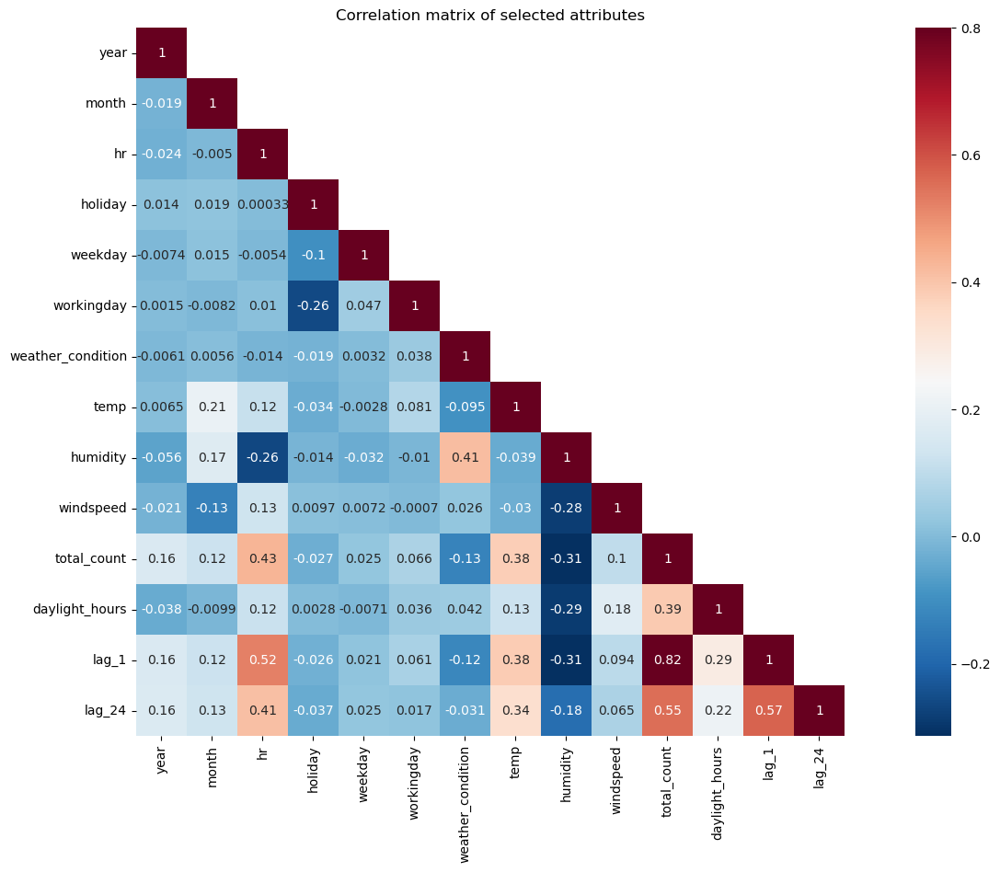

In [55]:
correMtr = model_df.corr() 
mask = np.array(correMtr)
mask[np.tril_indices_from(mask)] = False

# Heat map for correlation matrix of attributes
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(correMtr, mask=mask, vmax=0.8, square=True, annot=True, ax=ax, cmap = cmap)
ax.set_title('Correlation matrix of selected attributes')
plt.show()

## PART II: Prediction Model

In [42]:
def split_data(df, target_columns, test_size=0.3, random_state=42, scale_data=True):
    X = df.drop(columns=target_columns.columns)
    y = target_columns
 
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    y_train = y_train.values.ravel()
    y_test = y_test.values.ravel()
    
    if scale_data:
        # Initialize the StandardScaler
        scaler = StandardScaler()
        
        continuous_columns = X_train.select_dtypes(include=['float64', 'int64']).columns
        X_train[continuous_columns] = scaler.fit_transform(X_train[continuous_columns])
        X_test[continuous_columns] = scaler.transform(X_test[continuous_columns])
        
        with open('scaler.pkl', 'wb') as file:
            pickle.dump(scaler, file)

    return X_train, X_test, y_train, y_test

In [43]:
X_train, X_test, y_train, y_test = split_data(model_df, model_df[['total_count']], scale_data = True)

In [44]:
feature_names = [col for col in model_df.columns if col != 'total_count']
print(feature_names)

['year', 'month', 'hr', 'holiday', 'weekday', 'workingday', 'weather_condition', 'temp', 'humidity', 'windspeed', 'daylight_hours', 'lag_1', 'lag_24']


### Different models exploration

In [19]:
def evaluate_regression_models(X_train, X_test, y_train, y_test):
  
    # Create a list of regression models
    models_to_evaluate = [
        ('Decision Tree Regressor', DecisionTreeRegressor()),
        ('Gradient Boosting Regressor', GradientBoostingRegressor()),
        ('AdaBoost Regressor', AdaBoostRegressor()),
        ('XGB Regressor', xgb.XGBRegressor(enable_categorical=True))
    ]

    # Create dictionaries to store the results for each model
    results = {
        'Model': [],
        'MAE': [],
        'MSE': [],
        'R2': []
    }

    # Iterate through the models and evaluate them
    for model_name, model in models_to_evaluate:
        model.fit(X_train, y_train)

        y_pred = model.predict(X_test)

        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        results['Model'].append(model_name)
        results['MAE'].append(mae)
        results['MSE'].append(mse)
        results['R2'].append(r2)

    # Create a DataFrame from the results dictionary
    results_df = pd.DataFrame(results)

    return results_df

In [20]:
results = evaluate_regression_models(X_train, X_test, y_train, y_test)
display(results)

,Model,MAE,MSE,R2
0,Decision Tree Regressor,28.049877,2076.726901,0.902748
1,Gradient Boosting Regressor,29.561171,1975.485520,0.907489
2,AdaBoost Regressor,57.138952,4992.722704,0.766193
3,XGB Regressor,20.501716,1029.938600,0.951768


### Tuning XGB Regressor parameters

#### Model to predict total amount of users

In [21]:
def find_best_xgb_model(X_train, y_train, param_grid, X_test, y_test):
    best_model = None
    best_params = {}

    # Create an XGBoost regressor with evaluation metric and early stopping set in constructor
    xgb_model = xgb.XGBRegressor(
        enable_categorical=True,
        objective='reg:squarederror',
        eval_metric='rmse',  # Set evaluation metric here
        early_stopping_rounds=10,  # Set early stopping here
    )

    grid_search = GridSearchCV(
        estimator=xgb_model,
        param_grid=param_grid,
        scoring='r2',
        cv=5,
        n_jobs=1,
        verbose=0  # Increase verbosity for progress updates
    )

    grid_search.fit(X_train, y_train, eval_set=[(X_test, y_test)])
    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_

    return best_model, best_params

In [22]:
## after testing many combinations this is the best we could find

param_grid = {
    'learning_rate': [0.1],
    'n_estimators': [250],
    'max_depth': [6],
    'gamma': [0.12]
}
#    'lambda': [0.5, 1]

In [23]:
best_model, best_params = find_best_xgb_model(X_train, y_train, param_grid, X_test, y_test)

[0]	validation_0-rmse:133.60201
[1]	validation_0-rmse:122.77522
[2]	validation_0-rmse:112.96975
[3]	validation_0-rmse:104.07847
[4]	validation_0-rmse:96.15689
[5]	validation_0-rmse:89.05589
[6]	validation_0-rmse:83.12460
[7]	validation_0-rmse:77.55466
[8]	validation_0-rmse:72.88234
[9]	validation_0-rmse:68.52109
[10]	validation_0-rmse:64.77971
[11]	validation_0-rmse:61.29668
[12]	validation_0-rmse:58.18848
[13]	validation_0-rmse:55.56802
[14]	validation_0-rmse:53.55588
[15]	validation_0-rmse:51.72235
[16]	validation_0-rmse:49.76235
[17]	validation_0-rmse:48.29251
[18]	validation_0-rmse:46.86193
[19]	validation_0-rmse:45.64493
[20]	validation_0-rmse:44.44576
[21]	validation_0-rmse:43.33661
[22]	validation_0-rmse:42.43076
[23]	validation_0-rmse:41.68793
[24]	validation_0-rmse:40.93827
[25]	validation_0-rmse:40.34727
[26]	validation_0-rmse:39.82820
[27]	validation_0-rmse:39.38401
[28]	validation_0-rmse:38.92631
[29]	validation_0-rmse:38.49279
[30]	validation_0-rmse:38.24094
[31]	validatio

In [24]:
best_params_df = pd.DataFrame.from_dict(best_params, orient='index', columns=["Value"])

# Set the row names to be the hyperparameter names
best_params_df.index.name = 'Hyperparameter'

# Display the table
display(best_params_df)

,Value
Hyperparameter,
gamma,0.12
learning_rate,0.10
max_depth,6.00
n_estimators,250.00


#### Model evaluation

In [25]:
def display_regression_metrics(model, X, y):
    # Make predictions using the model
    y_pred = model.predict(X)

    r2 = r2_score(y, y_pred)

    mse = mean_squared_error(y, y_pred)

    mae = mean_absolute_error(y, y_pred)

    rmse = np.sqrt(mse)

    metrics_df = pd.DataFrame({
        'Metric': ['R-squared (R2)', 'Mean Squared Error (MSE)', 'Mean Absolute Error (MAE)', 'Root Mean Squared Error (RMSE)'],
        'Value': [r2, mse, mae, rmse]
    })

    return metrics_df

In [26]:
metrics_df = display_regression_metrics(best_model, X_test, y_test)
metrics_df

,Metric,Value
0,R-squared (R2),0.955881
1,Mean Squared Error (MSE),942.114247
2,Mean Absolute Error (MAE),19.436258
3,Root Mean Squared Error (RMSE),30.693880


In [28]:
def plot_xgb_results(best_xgb_model, feature_names, X_test, y_test, feature_importance_height=400, feature_importance_width=800):
    # Predict using the best XGBoost model
    y_pred = best_xgb_model.predict(X_test)
    y_pred = np.maximum(y_pred, 0)

    # Feature Importance Plot
    feature_importances = best_xgb_model.feature_importances_
    sorted_feature_importance = sorted(zip(feature_names, feature_importances), key=lambda x: x[1], reverse=True)

    fig_feature_importance = px.bar(
        x=[x[1] for x in sorted_feature_importance],
        y=[x[0] for x in sorted_feature_importance],
        orientation='h',
        labels={'x': 'Feature Importance', 'y': 'Features'},
        title='XGBoost Feature Importance'
    )

    # Set the dimensions of the first graph
    fig_feature_importance.update_layout(
        height=feature_importance_height,
        width=feature_importance_width,
    )

    # Actual vs. Predicted Distribution Plot
    fig_distribution = go.Figure()

    fig_distribution.add_trace(go.Histogram(x=y_test, name='Actual', opacity=0.75, marker_color='blue'))
    fig_distribution.add_trace(go.Histogram(x=y_pred, name='Predicted', opacity=0.75, marker_color='green'))

    fig_distribution.update_layout(
        title='Distribution of Actual vs. Predicted Values',
        xaxis_title='Value',
        yaxis_title='Frequency'
    )

    # Display both plots
    pyo.iplot(fig_feature_importance)
    pyo.iplot(fig_distribution)

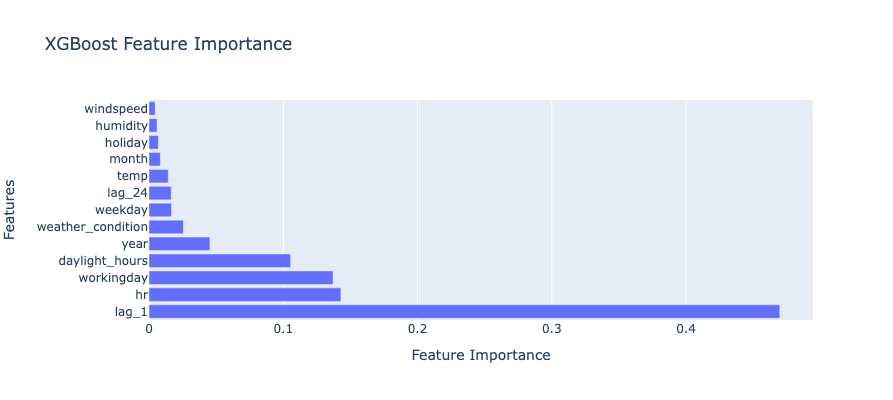

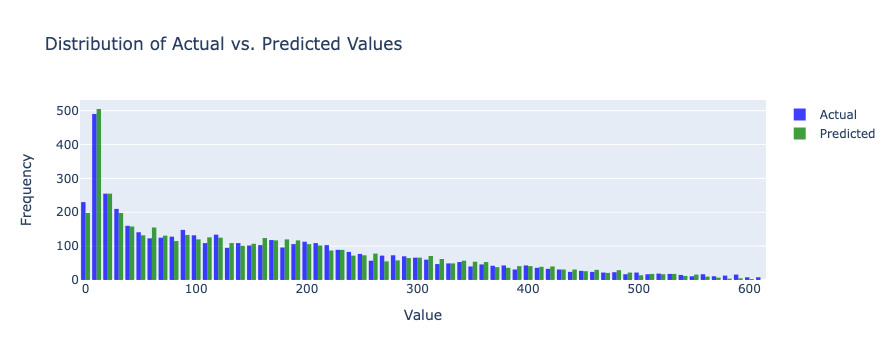

In [29]:
plot_xgb_results(best_model, feature_names, X_test, y_test)

## PART III: Streamlit dashboard

This is just test code for the streamlit part of the assignment

In [30]:
with open('xgb_model.pkl', 'wb') as model_file:
    pickle.dump(best_model, model_file)

with open('best_hyperparameters.pkl', 'wb') as params_file:
    pickle.dump(best_params, params_file)

In [31]:
import pickle
import xgboost as xgb

with open('xgb_model.pkl', 'rb') as model_file:
    loaded_xgb_model = pickle.load(model_file)

with open('best_hyperparameters.pkl', 'rb') as params_file:
    loaded_best_params = pickle.load(params_file)

In [32]:
with open('scaler.pkl', 'wb') as file:
    pickle.dump(scaler, file)

NameError: name 'scaler' is not defined

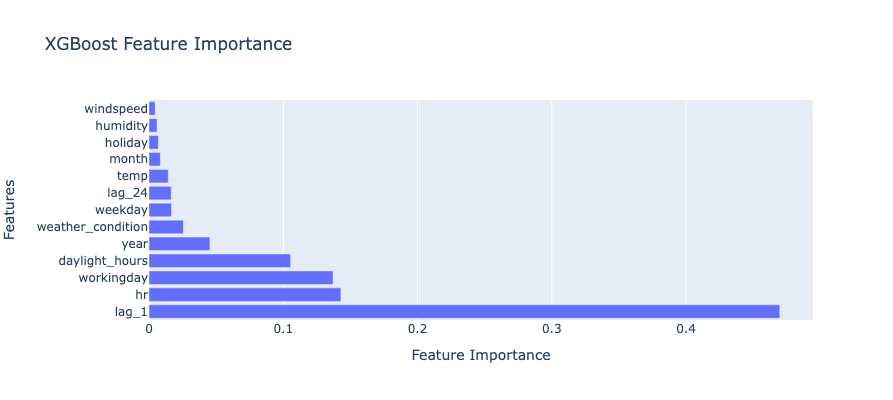

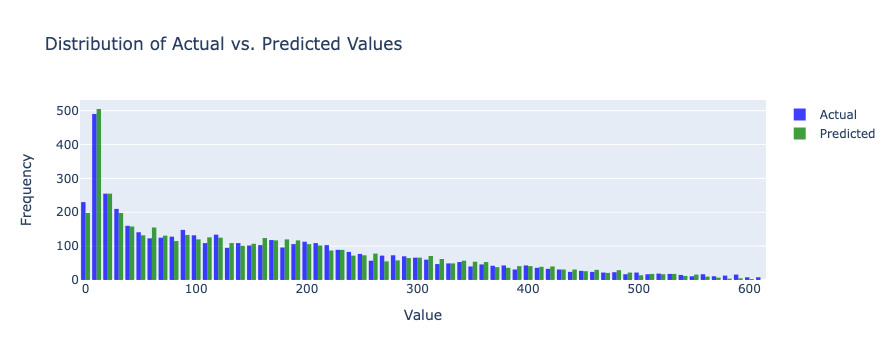

In [32]:
plot_xgb_results(loaded_xgb_model, feature_names, X_test, y_test)

In [33]:
##sample functions for bike prediction whose templates are used to make the streamlit function

import pandas as pd
from sklearn.preprocessing import StandardScaler

# Function to calculate daylight hours based on the hour input
def calculate_daylight_hours(hr):
    if 0 <= hr <= 7:
        return 0  # Night
    elif 8 <= hr <= 17:
        return 1  # Day
    else:
        return 0  # Night

# Function to preprocess user inputs
def preprocess_inputs(year, month, hr, holiday, weekday, workingday, weather_condition, temp, humidity, windspeed, lag_1, lag_24):
    # Map year to 0 and 1
    year_mapping = {2011: 0, 2012: 1}
    month = max(1, min(12, month))
    hr = max(0, min(23, hr))
    if holiday.lower() == 'is':
        holiday = 1
    else:
        holiday = 0
    weekday_mapping = {
        'monday': 0,
        'tuesday': 1,
        'wednesday': 2,
        'thursday': 3,
        'friday': 4,
        'saturday': 5,
        'sunday': 6
    }
    weekday = weekday_mapping.get(weekday.lower(), -1)  # -1 indicates an invalid input
    # Ensure weekday is in the range [0, 6]
    weekday = max(0, min(6, weekday))
    # Map workingday to 0 and 1
    workingday_mapping = {
        'yes': 1,
        'no': 0
    }
    # Use the mapping to convert the user input to the corresponding value
    workingday = workingday_mapping.get(workingday.lower(), -1)  # -1 indicates an invalid input
    # Ensure workingday is either 0 or 1
    workingday = max(0, min(1, workingday))
    weather_condition_mapping = {
        'clear': 1,
        'mist': 2,
        'light snow': 3,
        'heavy rain': 4
    }
    # Use the mapping to convert the user input to the corresponding value
    weather_condition = weather_condition_mapping.get(weather_condition.lower(), -1)  # -1 indicates an invalid input
    weather_condition = max(1, min(4, weather_condition))
    temp = temp / 100.0
    humidity = humidity / 100.0
    # Normalize wind speed by dividing by 67 (max wind speed)
    windspeed = windspeed / 67.0
    lag_1 = lag_1  # Lagged value 1
    lag_24 = lag_24  # Lagged value 24
    daylight_hours = calculate_daylight_hours(hr)

    # Create a DataFrame with user inputs
    user_inputs = pd.DataFrame({
        'year': [year_mapping.get(year, 0)],
        'month': [month],
        'hr': [hr],
        'holiday': [holiday],
        'weekday': [weekday],
        'workingday': [workingday],
        'weather_condition': [weather_condition],
        'temp': [temp],
        'humidity': [humidity],
        'windspeed': [windspeed],
        'lag_1': [lag_1],
        'lag_24': [lag_24],
        'daylight_hours': [daylight_hours]
    })

    # Feature scaling (only for numerical features)
    scaler = StandardScaler()
    user_inputs[['temp', 'humidity', 'windspeed', 'lag_1', 'lag_24', 'daylight_hours']] = scaler.fit_transform(user_inputs[['temp', 'humidity', 'windspeed', 'lag_1', 'lag_24', 'daylight_hours']])
    desired_order = ['year', 'month', 'hr', 'holiday', 'weekday', 'workingday', 'weather_condition', 'temp', 'humidity', 'windspeed', 'daylight_hours', 'lag_1', 'lag_24']
    user_inputs = user_inputs[desired_order]

    return user_inputs

# Function to make predictions using the trained model
def predict_bike_count(trained_model, user_inputs):
    # Make predictions using the trained model
    predicted_count = trained_model.predict(user_inputs)

    return predicted_count

# Example user inputs (replace with actual user inputs)
user_year = 2012
user_month = 5
user_hr = 15
user_holiday = 'no'
user_weekday = 'wednesday'
user_workingday = 'yes'
user_weather_condition = 'mist'
user_temp_input = 25.0  # Input temperature in Celsius
user_humidity_input = 65.0  # Input humidity
user_windspeed_input = 10.0  # Input wind speed in km/h
user_lag_1 = 50  # Example lagged value 1
user_lag_24 = 60  # Example lagged value 24

# Preprocess user inputs
user_inputs = preprocess_inputs(user_year, user_month, user_hr, user_holiday, user_weekday, user_workingday, user_weather_condition, user_temp_input, user_humidity_input, user_windspeed_input, user_lag_1, user_lag_24)

# Call the prediction function with preprocessed user inputs and trained model
predicted_count = predict_bike_count(loaded_xgb_model, user_inputs)

# Display the predicted count
print(f'Predicted bike count: {predicted_count[0]:.0f}')

Predicted bike count: 104
